In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path
from model import SingleModel, create_backbone_efficient
from segmentation_models.models import unet


Segmentation Models: using `keras` framework.


In [6]:
class UavidDataset:
    @staticmethod
    def labels():
        return ["bg", "blding", "road", "tree", "vege", "movcar", "satcar", "human"]

    @staticmethod
    def get_image_decode(image, label):
        image = tf.io.read_file(image, "image")
        label = tf.io.read_file(label, "label")

        image = tf.image.decode_image(image)
        label = tf.image.decode_image(label)

        return image, label

    # [w, h, c], 448, 448, 3
    @staticmethod
    def decode_crop(image, label):
        img_array = []
        label_array = []

        for index in range(64):
            x, y = index // 8, index % 8
            img_array.append(image[512 * x : 512 * (1 + x), 288 * y : 288 * (1 + y)])
            label_array.append(label[448 * x : 448 * (1 + x), 448 * y : 448 * (1 + y)])

        return tf.data.Dataset.from_tensor_slices((img_array, label_array))

    @staticmethod
    def get_mask(image, label):
        labels = []
        labels.append(
            (label[:, :, 0] == 0) & (label[:, :, 1] == 0) & (label[:, :, 2] == 0)
        )
        labels.append(
            (label[:, :, 0] == 128) & (label[:, :, 1] == 0) & (label[:, :, 2] == 0)
        )
        labels.append(
            (label[:, :, 0] == 128) & (label[:, :, 1] == 64) & (label[:, :, 2] == 128)
        )
        labels.append(
            (label[:, :, 0] == 0) & (label[:, :, 1] == 128) & (label[:, :, 2] == 0)
        )
        labels.append(
            (label[:, :, 0] == 128) & (label[:, :, 1] == 128) & (label[:, :, 2] == 0)
        )
        labels.append(
            (label[:, :, 0] == 64) & (label[:, :, 1] == 0) & (label[:, :, 2] == 128)
        )
        labels.append(
            (label[:, :, 0] == 192) & (label[:, :, 1] == 0) & (label[:, :, 2] == 192)
        )
        labels.append(
            (label[:, :, 0] == 64) & (label[:, :, 1] == 64) & (label[:, :, 2] == 0)
        )
        labels = tf.cast(labels, tf.float32)
        image = tf.cast(image, tf.float32)

        # must perform this
        return image, tf.transpose(labels, [1, 2, 0])

    @staticmethod
    def create_ds(
        batch_size,
        path_dir="/home/hackerton/Downloads/uavid_v1.5_official_release_image/",
        maximage=False,
        seed=1024,
        test_batch_size=None,
    ):
        directory = Path(path_dir)
        images = [
            str(x.absolute()) for x in directory.glob("uavid_train/**/Images/*.png")
        ]
        labels = [
            str(x.absolute()) for x in directory.glob("uavid_train/**/Labels/*.png")
        ]
        ds_train: tf.data.Dataset = tf.data.Dataset.from_tensor_slices((images, labels))
        ds_train = ds_train.shuffle(len(images), seed=seed)

        images = [
            str(x.absolute()) for x in directory.glob("uavid_val/**/Images/*.png")
        ]
        labels = [
            str(x.absolute()) for x in directory.glob("uavid_val/**/Labels/*.png")
        ]
        ds_test: tf.data.Dataset = tf.data.Dataset.from_tensor_slices((images, labels))

        ds_train = ds_train.map(UavidDataset.get_image_decode, tf.data.AUTOTUNE)
        ds_test = ds_test.map(UavidDataset.get_image_decode, tf.data.AUTOTUNE)

        if not maximage:
            ds_train = ds_train.flat_map(UavidDataset.decode_crop)
            ds_test = ds_test.flat_map(UavidDataset.decode_crop)

        ds_train = ds_train.map(UavidDataset.get_mask, tf.data.AUTOTUNE)
        ds_test = ds_test.map(UavidDataset.get_mask, tf.data.AUTOTUNE)

        ds_train = ds_train.batch(batch_size)
        ds_test = ds_test.batch(test_batch_size if test_batch_size else batch_size)

        ds_train = ds_train.prefetch(tf.data.AUTOTUNE)
        ds_test = ds_test.prefetch(tf.data.AUTOTUNE)

        return ds_train, ds_test


train, test = UavidDataset.create_ds(
    batch_size=1,
    path_dir="C:\\Users\\LamKenLun\\Documents\\uavid_v1.5_official_release_image",
)

for image, label in train.take(72):
    print(image.shape)

InvalidArgumentError: Shapes of all inputs must match: values[0].shape = [512,288,3] != values[32].shape = [112,288,3]
	 [[{{node normalize_element/component_0}}]] [Op:IteratorGetNext]

C:\Users\LamKenLun\AppData\Local\Temp\ipykernel_9180\233787941.py:134: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


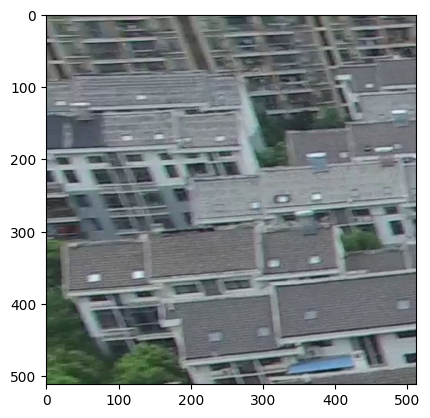

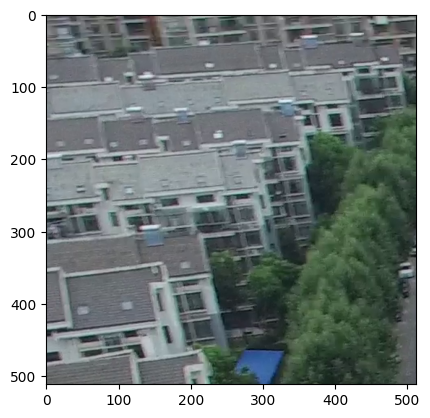

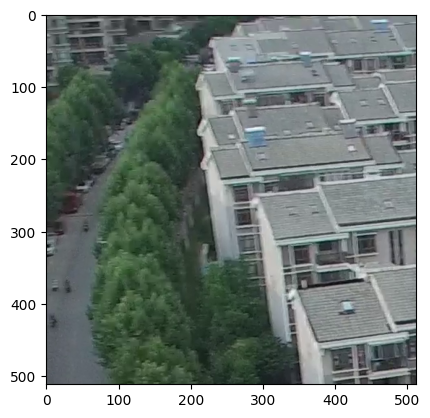

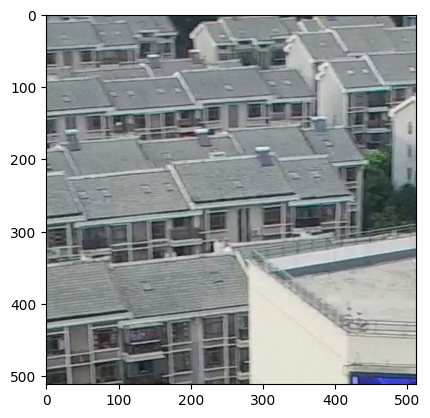

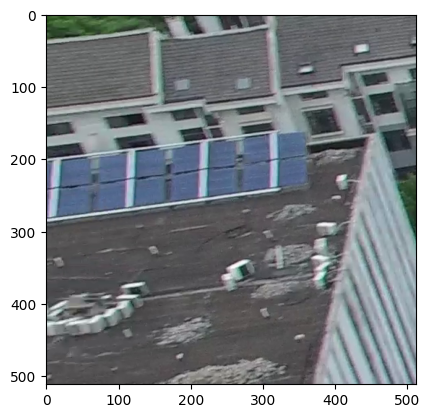

...

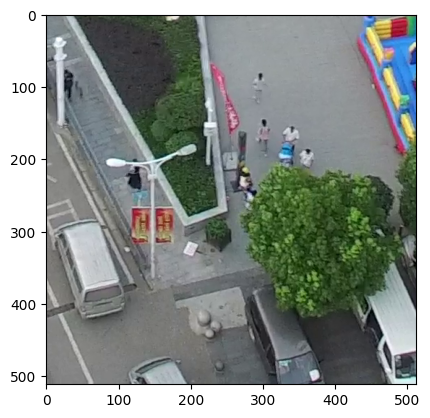

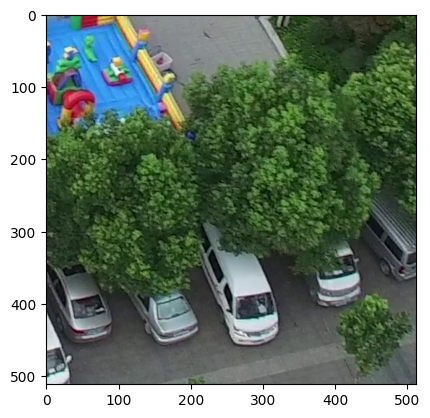

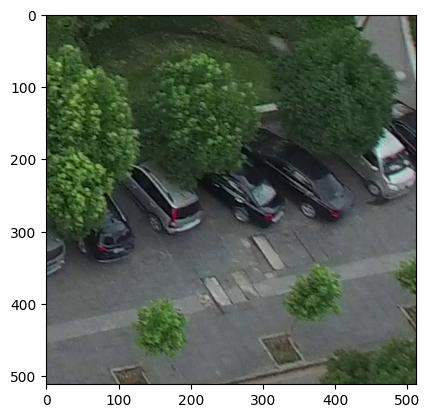

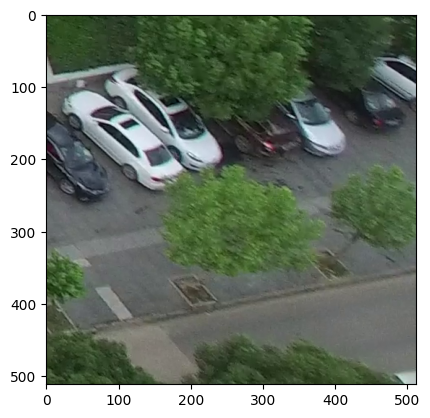

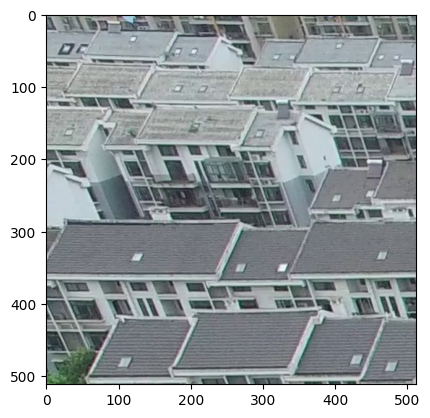

In [157]:
class UavidDataset:
    @staticmethod
    def labels():
        return ["bg", "blding", "road", "tree", "vege", "movcar", "satcar", "human"]

    @staticmethod
    def get_image_decode(image, label):
        image = tf.io.read_file(image, "image")
        label = tf.io.read_file(label, "label")

        image = tf.image.decode_image(image)
        label = tf.image.decode_image(label)

        return image, label

    # [w, h, c], 448, 448, 3
    @staticmethod
    def decode_crop(image, label):
        img_array = []
        label_array = []

        blocks = [
            (0, 1024, 0, 2048),
            (0, 1024, 896, 2944),
            (0, 1024, 1792, 3840),
            (568, 1592, 0, 2048),
            (568, 1592, 896, 2944),
            (568, 1592, 1792, 3840),
            (1136, 2160, 0, 2048),
            (1136, 2160, 896, 2944),
            (1136, 2160, 1792, 3840),
        ]

        for y_min, y_max, x_min, x_max in blocks:
            for index in range(8):
                y, x = index // 4, index % 4
                block_y_min = y_min + (y * 512)
                block_y_max = y_min + (y + 1) * 512
                block_x_min = x_min + x * 512
                block_x_max = x_min + (x + 1) * 512
                img_array.append(
                    image[block_y_min:block_y_max, block_x_min:block_x_max]
                )
                label_array.append(
                    label[block_y_min:block_y_max, block_x_min:block_x_max]
                )

        return tf.data.Dataset.from_tensor_slices((img_array, label_array))

    @staticmethod
    def get_mask(image, label):
        labels = []
        labels.append(
            (label[:, :, 0] == 0) & (label[:, :, 1] == 0) & (label[:, :, 2] == 0)
        )
        labels.append(
            (label[:, :, 0] == 128) & (label[:, :, 1] == 0) & (label[:, :, 2] == 0)
        )
        labels.append(
            (label[:, :, 0] == 128) & (label[:, :, 1] == 64) & (label[:, :, 2] == 128)
        )
        labels.append(
            (label[:, :, 0] == 0) & (label[:, :, 1] == 128) & (label[:, :, 2] == 0)
        )
        labels.append(
            (label[:, :, 0] == 128) & (label[:, :, 1] == 128) & (label[:, :, 2] == 0)
        )
        labels.append(
            (label[:, :, 0] == 64) & (label[:, :, 1] == 0) & (label[:, :, 2] == 128)
        )
        labels.append(
            (label[:, :, 0] == 192) & (label[:, :, 1] == 0) & (label[:, :, 2] == 192)
        )
        labels.append(
            (label[:, :, 0] == 64) & (label[:, :, 1] == 64) & (label[:, :, 2] == 0)
        )
        labels = tf.cast(labels, tf.float32)
        image = tf.cast(image, tf.float32)

        # must perform this
        return image, tf.transpose(labels, [1, 2, 0])

    @staticmethod
    def create_ds(
        batch_size,
        path_dir="/home/hackerton/Downloads/uavid_v1.5_official_release_image/",
        maximage=False,
        seed=1024,
        test_batch_size=None,
    ):
        directory = Path(path_dir)
        images = [
            str(x.absolute()) for x in directory.glob("uavid_train/**/Images/*.png")
        ]
        labels = [
            str(x.absolute()) for x in directory.glob("uavid_train/**/Labels/*.png")
        ]
        ds_train: tf.data.Dataset = tf.data.Dataset.from_tensor_slices((images, labels))
        ds_train = ds_train.shuffle(len(images), seed=seed)

        images = [
            str(x.absolute()) for x in directory.glob("uavid_val/**/Images/*.png")
        ]
        labels = [
            str(x.absolute()) for x in directory.glob("uavid_val/**/Labels/*.png")
        ]
        ds_test: tf.data.Dataset = tf.data.Dataset.from_tensor_slices((images, labels))

        ds_train = ds_train.map(UavidDataset.get_image_decode, tf.data.AUTOTUNE)
        ds_test = ds_test.map(UavidDataset.get_image_decode, tf.data.AUTOTUNE)

        if not maximage:
            ds_train = ds_train.flat_map(UavidDataset.decode_crop)
            ds_test = ds_test.flat_map(UavidDataset.decode_crop)

        ds_train = ds_train.map(UavidDataset.get_mask, tf.data.AUTOTUNE)
        ds_test = ds_test.map(UavidDataset.get_mask, tf.data.AUTOTUNE)

        ds_train = ds_train.batch(batch_size)
        ds_test = ds_test.batch(test_batch_size if test_batch_size else batch_size)

        ds_train = ds_train.prefetch(tf.data.AUTOTUNE)
        ds_test = ds_test.prefetch(tf.data.AUTOTUNE)

        return ds_train, ds_test


train, test = UavidDataset.create_ds(
    batch_size=1,
    path_dir="C:\\Users\\LamKenLun\\Documents\\uavid_v1.5_official_release_image",
)

for img, lbl in test.take(73):
    plt.figure()
    plt.imshow(img[0] / 255)


In [142]:
blocks = [
    (0, 1024, 0, 2048),
    (0, 1024, 896, 2944),
    (0, 1024, 1792, 3840),
    (568, 1592, 0, 2048),
    (568, 1592, 896, 2944),
    (568, 1592, 1792, 3840),
    (1136, 2160, 0, 2048),
    (1136, 2160, 896, 2944),
    (1136, 2160, 1792, 3840),
]

for y_min, y_max, x_min, x_max in blocks:
    print('block')
    for index in range(8):
        y, x = index // 4, index % 4
        block_y_min = y_min + (y * 512)
        block_y_max = y_min + (y + 1) * 512
        block_x_min = x_min + x * 512
        block_x_max = x_min + (x + 1) * 512

block
0 512 0 512
0 512 512 1024
0 512 1024 1536
0 512 1536 2048
512 1024 0 512
512 1024 512 1024
512 1024 1024 1536
512 1024 1536 2048
block
0 512 896 1408
0 512 1408 1920
0 512 1920 2432
0 512 2432 2944
512 1024 896 1408
512 1024 1408 1920
512 1024 1920 2432
512 1024 2432 2944
block
0 512 1792 2304
0 512 2304 2816
0 512 2816 3328
0 512 3328 3840
512 1024 1792 2304
512 1024 2304 2816
512 1024 2816 3328
512 1024 3328 3840
block
568 1080 0 512
568 1080 512 1024
568 1080 1024 1536
568 1080 1536 2048
1080 1592 0 512
1080 1592 512 1024
1080 1592 1024 1536
1080 1592 1536 2048
block
568 1080 896 1408
568 1080 1408 1920
568 1080 1920 2432
568 1080 2432 2944
1080 1592 896 1408
1080 1592 1408 1920
1080 1592 1920 2432
1080 1592 2432 2944
block
568 1080 1792 2304
568 1080 2304 2816
568 1080 2816 3328
568 1080 3328 3840
1080 1592 1792 2304
1080 1592 2304 2816
1080 1592 2816 3328
1080 1592 3328 3840
block
1136 1648 0 512
1136 1648 512 1024
1136 1648 1024 1536
1136 1648 1536 2048
1648 2160 0 512
164

In [156]:
for y_min, y_max in [(0, 1024), (568, 1592), (1136, 2160)]:
    for x_min, x_max in [(0, 2048), (896, 2944), (1792, 3840)]:
        print(y_min, y_max, x_min, x_max)

0 1024 0 2048
0 1024 896 2944
0 1024 1792 3840
568 1592 0 2048
568 1592 896 2944
568 1592 1792 3840
1136 2160 0 2048
1136 2160 896 2944
1136 2160 1792 3840


In [81]:
print(0, 1024)
print(568, 1592)
print(1136, 2160)

0 1024
568 1592
1136 2160


In [ ]:
def generate_dataset(input_dataset, output_location):
    directory = Path(input_dataset)
    images = [str(x.absolute()) for x in directory.glob("uavid_train\**\Images\*.png")]

    for image_link in images[:1]:
        image = tf.io.read_file(image_link, "image")
        image = tf.image.decode_image(image)

        for index in range(0, 64):
            x, y = index // 8, index % 8
            this_image = image[288 * x : 288 * (1 + x), 512 * y : 512 * (1 + y)]
            tf.io.write_file(
                f"{output_location}\\{index}.jpg", tf.io.encode_jpeg(this_image)
            )


generate_dataset(
    input_dataset="C:\\Users\\LamKenLun\\Documents\\uavid_v1.5_official_release_image",
    output_location="C:\\Users\\LamKenLun\\Documents\\preprocessed",
)


In [ ]:
scale = 32
horizontal = 16 * scale
vertical = 9 * scale

print(horizontal, vertical)

In [ ]:
3840 / 512, 2160 / 288

In [3]:
# Testing all inputs for network

size_error = []

model = SingleModel.FPN()
# for i in range(1, 449):
#     try:
#         test_input = tf.random.uniform([1, 256 + i, 256 + i, 3])
#         model(test_input, training=False)
#         size_error.append(i + 256)
#     except:
#         pass


In [70]:
model.call(tf.ones([1, 540, 512, 3]))

ValueError: Inputs have incompatible shapes. Received shapes (32, 32, 256) and (33, 32, 256)

In [ ]:
for i in backbone(tf.random.uniform([1, 480, 512, 3])):
    print(i.shape)


In [ ]:
for i in backbone(tf.random.uniform([1, 448, 448, 3])):
    print(i.shape)


In [ ]:
288 / 9

In [ ]:
print(size_error)
